# Chapter 8: Image Enhancements using Derivatives 

## Image derivatives – Gradient and Laplacian

In [2]:
%matplotlib inline
from scipy import signal, misc, ndimage
from scipy.signal import convolve2d
from skimage import filters, feature, img_as_float
from skimage.util import random_noise
from skimage.filters import gaussian, laplace
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import pyramid_gaussian, pyramid_laplacian
from skimage.transform import pyramid_reduce, pyramid_laplacian, pyramid_expand, resize
from PIL import Image, ImageFilter
from PIL.ImageFilter import (FIND_EDGES, EDGE_ENHANCE, EDGE_ENHANCE_MORE)
from scipy.ndimage import gaussian_filter
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.pylab as plt
import numpy as np
from numpy import pi
import warnings
warnings.filterwarnings('ignore')

In [4]:
def plot_image(image, title):
    plt.imshow(image), plt.title(title, size=15), plt.axis('off')

def plot_all_images(im, im_x, im_y, im_mag, im_dir):
    plt.figure(figsize=(10,8))
    plt.gray()
    plt.subplots_adjust(0,0,1,0.95,0.05,0.05)
    plt.subplot(231), plot_image(im, 'original')
    plt.subplot(232), plot_image(im_x, 'grad_x')
    plt.subplot(233), plot_image(im_y, 'grad_y')
    plt.subplot(234), plot_image(im_mag, '||grad||')
    plt.subplot(235), plot_image(im_dir, r'$\theta$')
    plt.subplot(236)
    plt.plot(range(im.shape[1]), im[0,:], 'b-', label=r'$f(x,y)|_{x=0}$', linewidth=5)
    plt.plot(range(im.shape[1]), im_x[0,:], 'r-', label=r'$grad_x (f(x,y))|_{x=0}$')
    plt.title(r'$grad_x (f(x,y))|_{x=0}$', size=18)
    plt.legend(prop={'size': 20})
    plt.show()

### Derivatives and gradients

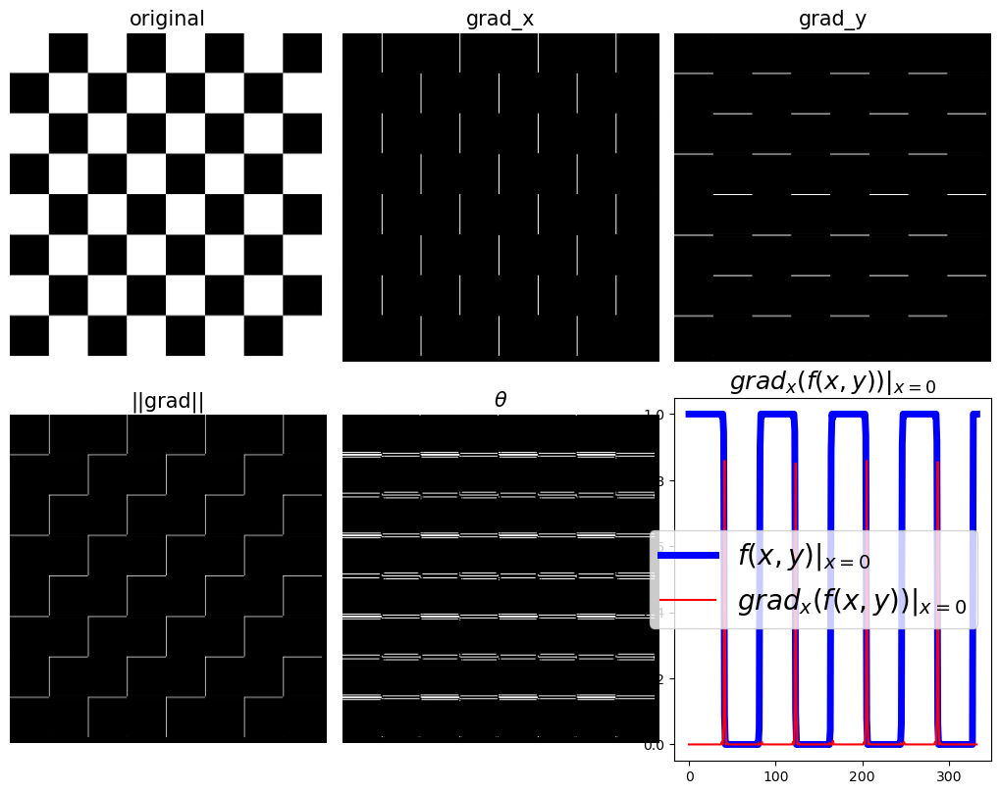

In [24]:
def compute_grads(im):
    im_x = np.clip(signal.convolve2d(im, ker_x, mode='same'), 0, 1)
    im_y = np.clip(signal.convolve2d(im, ker_y, mode='same'), 0, 1)
    im_mag = np.sqrt(im_x**2 + im_y**2)
    im_dir = np.arctan(im_y / (im_x + eps))
    return im_x, im_y, im_mag, im_dir
    
eps = 1e-6
ker_x = [[-1, 1]]
ker_y = [[-1], [1]]
im = rgb2gray(imread('images/chess.png')[...,:3])
im_x, im_y, im_mag, im_dir = compute_grads(im)
plot_all_images(im, im_x, im_y, im_mag, im_dir)

### Displaying the gradient magnitude (edge strength) and angle (edge direction) on the same image

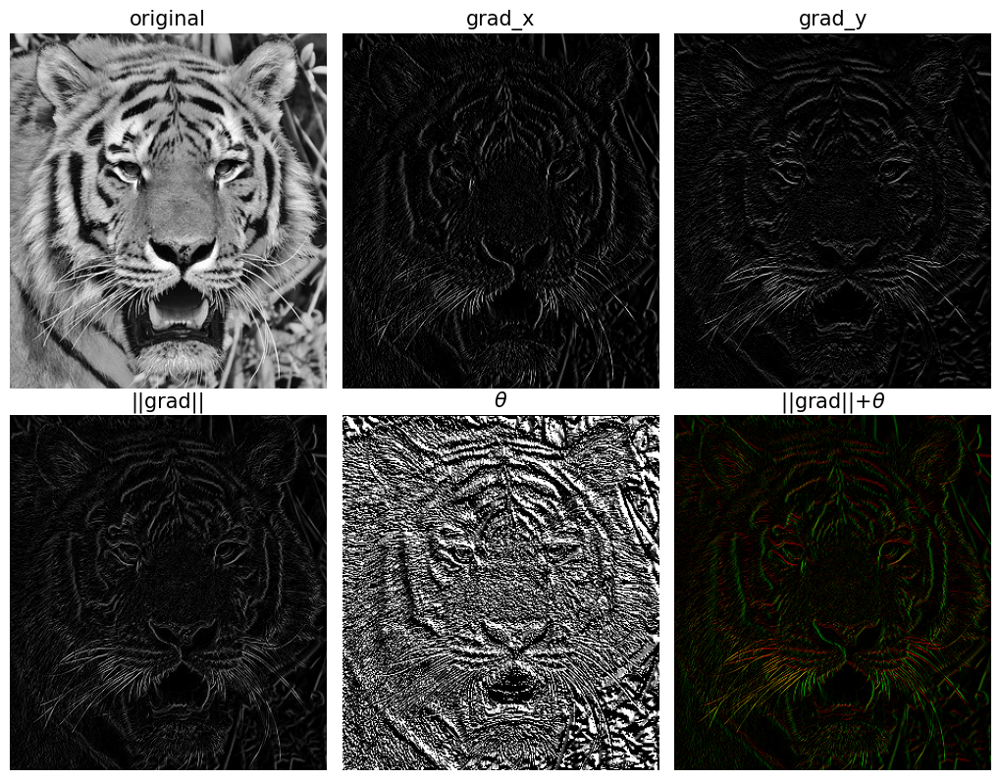

In [26]:
def plot_all_images_with_col_grad(im, im_x, im_y, im_mag, im_ang):
    plt.figure(figsize=(10,8))
    plt.gray()
    plt.subplots_adjust(0,0,1,0.95,0.05,0.05)
    plt.subplot(231), plot_image(im, 'original')
    plt.subplot(232), plot_image(im_x, 'grad_x')
    plt.subplot(233), plot_image(im_y, 'grad_y')
    plt.subplot(234), plot_image(im_mag, '||grad||')
    plt.subplot(235), plot_image(im_ang, r'$\theta$')
    plt.subplot(236)
    im = np.zeros((im.shape[0],im.shape[1],3))
    im[...,0] = im_mag*np.sin(im_ang)
    im[...,1] = im_mag*np.cos(im_ang)
    plt.imshow((im)), plt.title(r'||grad||+$\theta$', size=15), plt.axis('off')
    plt.show()
    

im = rgb2gray(imread('images/tiger.jpg'))
im_x, im_y, im_mag, im_dir = compute_grads(im)
plot_all_images_with_col_grad(im, im_x, im_y, im_mag, im_dir)

### The Laplacian

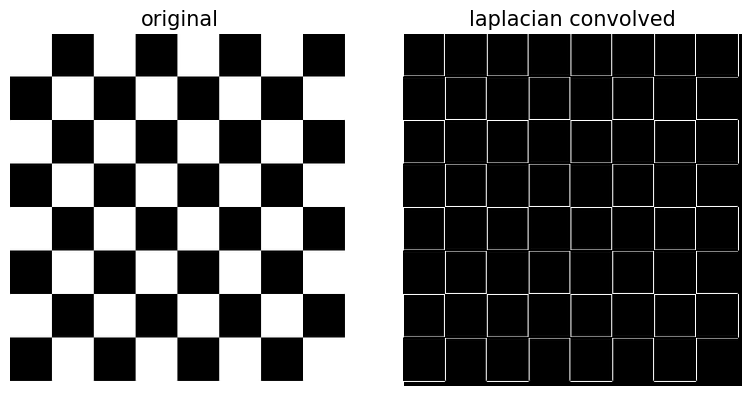

In [28]:
ker_laplacian = [[0,-1,0],[-1, 4, -1],[0,-1,0]]
im = rgb2gray(imread('images/chess.png')[...,:3])
im1 = np.clip(signal.convolve2d(im, ker_laplacian, mode='same'),0,1)
plt.figure(figsize=(8,4))
plt.subplot(121), plot_image(im, 'original')
plt.subplot(122), plot_image(im1, 'laplacian convolved')
plt.tight_layout()
plt.show()

### Blur Detection in Images using Laplacian Variance with `opencv-python` 

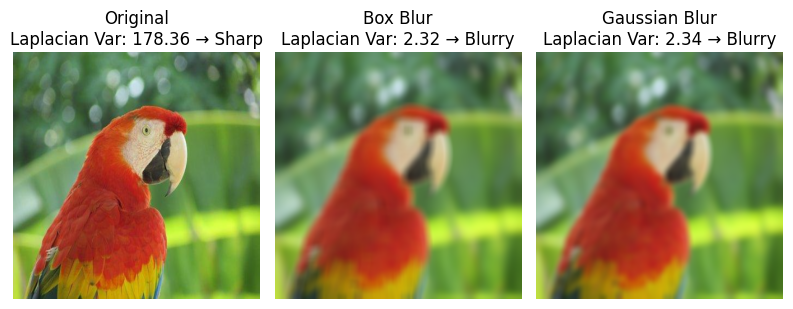

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def variance_of_laplacian(image):
    """Compute the variance of the Laplacian (second derivatives)."""
    lap = cv2.Laplacian(image, cv2.CV_64F)
    return lap.var()

def apply_box_blur(image, ksize=15):
    """Apply uniform box blur."""
    return cv2.blur(image, (ksize, ksize))

def apply_gaussian_blur(image, ksize=15, sigma=5):
    """Apply Gaussian blur."""
    return cv2.GaussianBlur(image, (ksize, ksize), sigma)

def detect_blur(image, threshold=100.0):
    """Detect blur using variance of the Laplacian."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    var_lap = variance_of_laplacian(gray)
    is_blurry = var_lap < threshold
    return is_blurry, var_lap

# Load and resize image
img_path = 'images/parrot.jpg'
original = cv2.imread(img_path)
original = cv2.resize(original, (400, 400))

# Apply filters
blur_box = apply_box_blur(original, ksize=15)
blur_gaussian = apply_gaussian_blur(original, ksize=15, sigma=5)

# Create image dictionary
images = {
    "Original": original,
    "Box Blur": blur_box,
    "Gaussian Blur": blur_gaussian
}

# Display results
plt.figure(figsize=(8, 3))
for i, (title, img) in enumerate(images.items()):
    is_blur, score = detect_blur(img)
    label = f"{title}\nLaplacian Var: {score:.2f} → {'Blurry' if is_blur else 'Sharp'}"
    
    plt.subplot(1, 3, i+1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(label)
    plt.axis('off')

plt.tight_layout()
plt.show()

### Effects of noise on gradient computation

1.0


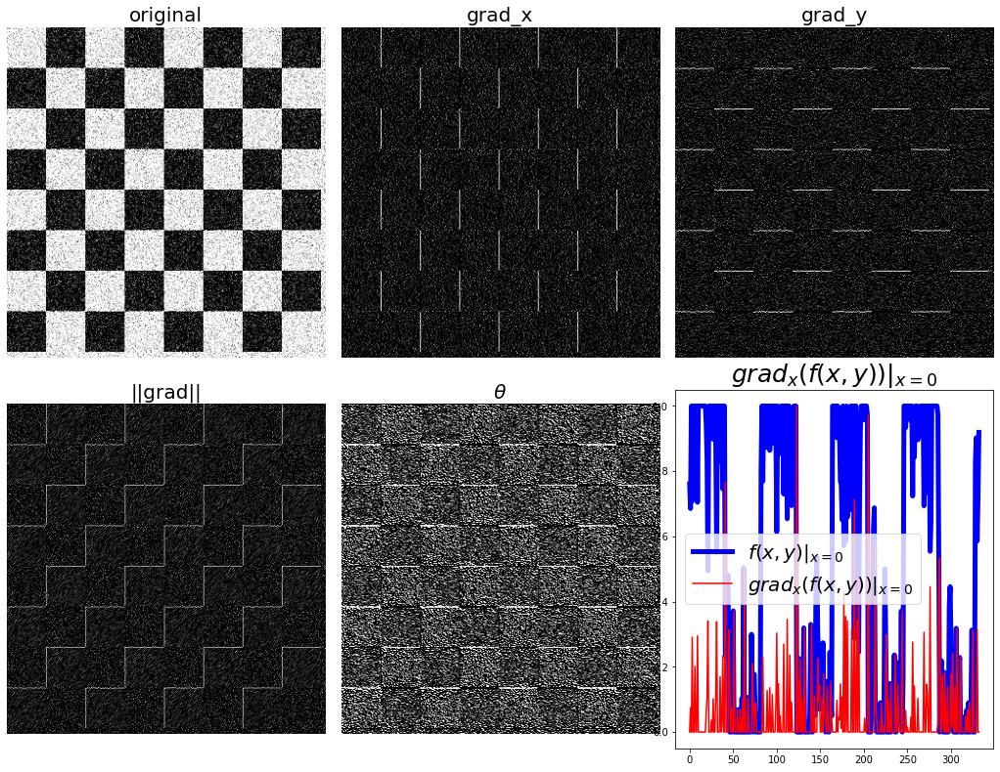

In [14]:
im = rgb2gray(imread('images/chess.png'))
sigma = 0.25
im = random_noise(im, var=sigma**2)
print(np.max(im))
im_x, im_y, im_mag, im_dir = compute_grads(im)
plot_all_images(im, im_x, im_y, im_mag, im_dir)

### Sharpening and unsharp masking

### Sharpening with Laplacian

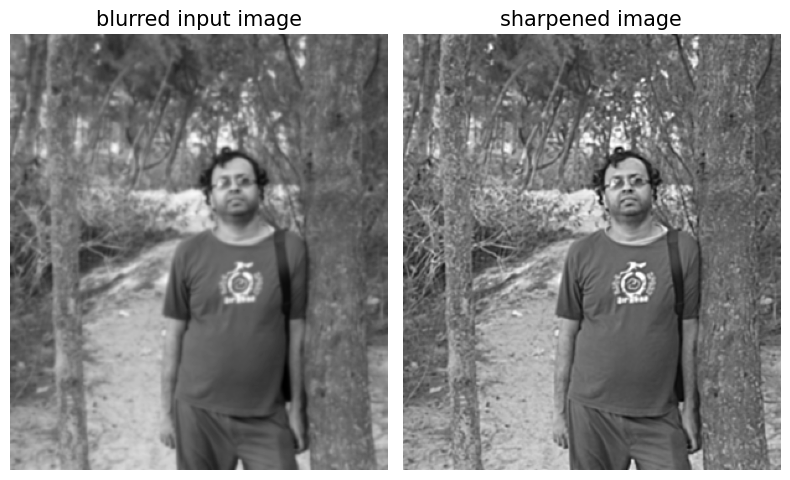

In [30]:
im = gaussian(rgb2gray(imread('images/me.jpeg')), sigma=1)
im1 = np.clip(laplace(im) + im, 0, 1)
plt.figure(figsize=(8,5))
plt.subplot(121), plot_image(im, 'blurred input image')
plt.subplot(122), plot_image(im1, 'sharpened image')
plt.tight_layout()
plt.show()

### Unsharp masking

### With `PIL.ImageFilter` module

In [ ]:
from PIL import Image, ImageFilter
import matplotlib.pyplot as plt

# Load image
image = Image.open("images/me.jpg").convert("RGB")

# Apply Unsharp Mask from PIL
sharpened_pil = image.filter(ImageFilter.UnsharpMask(radius=2, percent=150, threshold=3))

# Display
plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Original (PIL)")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(sharpened_pil)
plt.title("Unsharp Mask (PIL)")
plt.axis("off")
plt.tight_layout()
plt.show()

### With `opencv-python`

In [ ]:
import cv2
import numpy as np

# Load image
img = cv2.imread("images/me.jpg")
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Apply Gaussian Blur
blurred = cv2.GaussianBlur(img, (0, 0), sigmaX=2)

# Unsharp Mask
alpha = 1.5
sharpened_cv = cv2.addWeighted(img, 1 + alpha, blurred, -alpha, 0)
sharpened_cv_rgb = cv2.cvtColor(sharpened_cv, cv2.COLOR_BGR2RGB)

# Display
plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title("Original (OpenCV)")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(sharpened_cv_rgb)
plt.title("Unsharp Mask (OpenCV)")
plt.axis("off")
plt.tight_layout()
plt.show()

### With `scipy.ndimage` module

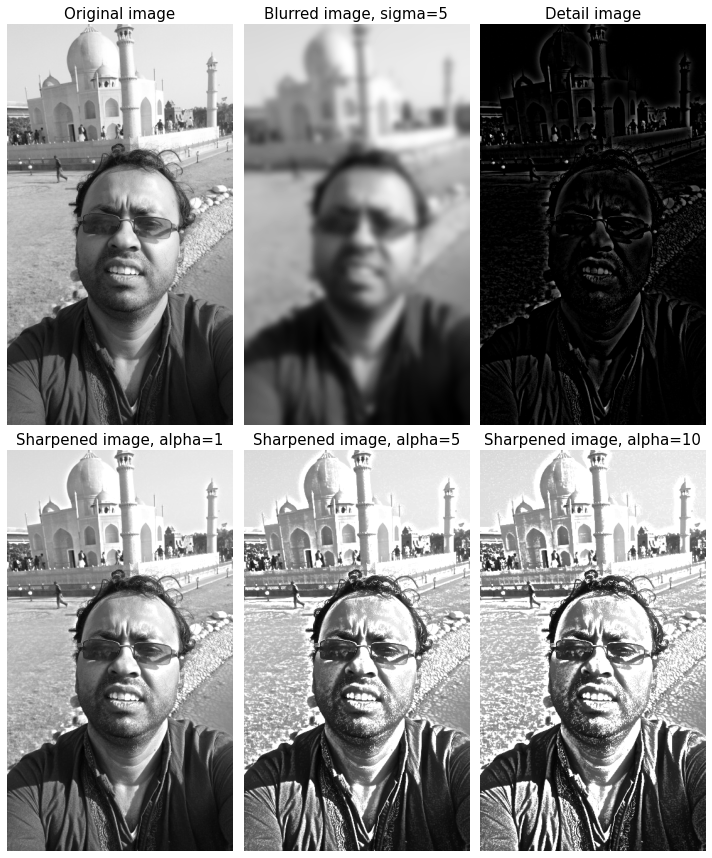

In [30]:
def rgb2gray(im):
    '''
    the input image is an RGB image
    with pixel values for each channel in [0,1]
    '''
    return np.clip(0.2989 * im[...,0] + 0.5870 * im[...,1] + 0.1140 * im[...,2], 0, 1)

im = rgb2gray(img_as_float(plt.imread('images/me.jpg')))
im_blurred = ndimage.gaussian_filter(im, 5)
im_detail = np.clip(im - im_blurred, 0, 1)
fig, axes = plt.subplots(nrows=2, ncols=3, sharex=True, sharey=True, figsize=(10, 12))
plt.gray()
axes = axes.ravel()
axes[0].set_title('Original image', size=15), axes[0].imshow(im)
axes[1].set_title('Blurred image, sigma=5', size=15),
axes[1].imshow(im_blurred)
axes[2].set_title('Detail image', size=15), axes[2].imshow(im_detail)
alpha = [1, 5, 10]
for i in range(3):
    im_sharp = np.clip(im + alpha[i]*im_detail, 0, 1)
    axes[3+i].imshow(im_sharp), axes[3+i].set_title('Sharpened image, alpha=' + str(alpha[i]), size=15)
for ax in axes:
    ax.axis('off')
fig.tight_layout()
plt.show()

### Entropy-Based Contrast Enhancement Using Gamma Correction with `scipy.optimize`

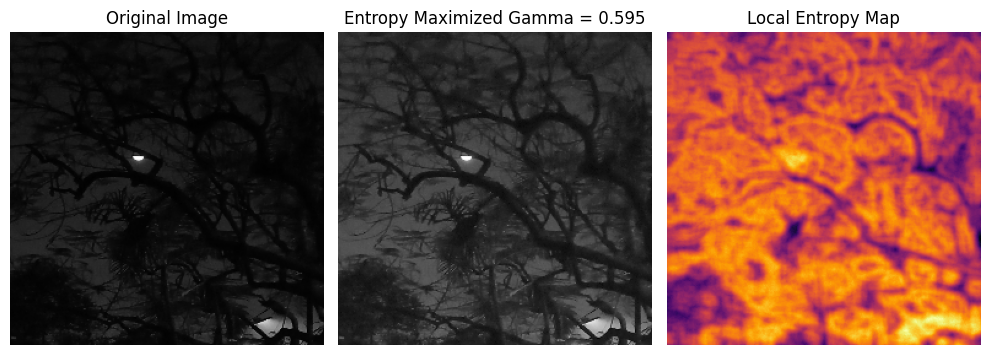

In [34]:
from skimage.filters.rank import entropy
from skimage.morphology import disk
from scipy.optimize import minimize_scalar

# Load and resize grayscale image
img = cv2.imread('images/moon.jpg', cv2.IMREAD_GRAYSCALE)
img = cv2.resize(img, (256, 256))  # standard size for visualization

# Normalize image to [0, 1]
img_norm = img / 255.0

# Define entropy computation
def compute_entropy(image):
    hist, _ = np.histogram(image, bins=256, range=(0, 1), density=True)
    hist += 1e-12  # to avoid log(0)
    return -np.sum(hist * np.log2(hist))

# Define gamma enhancement
def enhance_with_gamma(image, gamma):
    return np.power(np.clip(image, 0, 1), gamma)

# Objective function for optimization
def objective(gamma):
    enhanced = enhance_with_gamma(img_norm, gamma)
    return -compute_entropy(enhanced)  # minimize negative entropy

# Find optimal gamma
res = minimize_scalar(objective, bounds=(0.1, 0.75), method='bounded')
optimal_gamma = res.x
enhanced_img = enhance_with_gamma(img_norm, optimal_gamma)
# Convert to 8-bit image
img_out = (enhanced_img * 255).astype(np.uint8)
entropy_map = entropy(img_out, disk(5))

# Visualization
plt.figure(figsize=(10, 4))
plt.subplot(131), plt.imshow(img, cmap='gray'), plt.title('Original Image'), plt.axis('off')
plt.subplot(132), plt.imshow(img_out, cmap='gray'), plt.title(f'Entropy Maximized Gamma = {optimal_gamma:.3f}')
plt.axis('off')
plt.subplot(133), plt.imshow(entropy_map, cmap='inferno'), plt.title('Local Entropy Map')
plt.axis('off')

plt.tight_layout()
plt.show()

## Edge detection using derivatives and filters (Sobel, Canny, and so on)

### Sobel edge detector with `scikit-image`

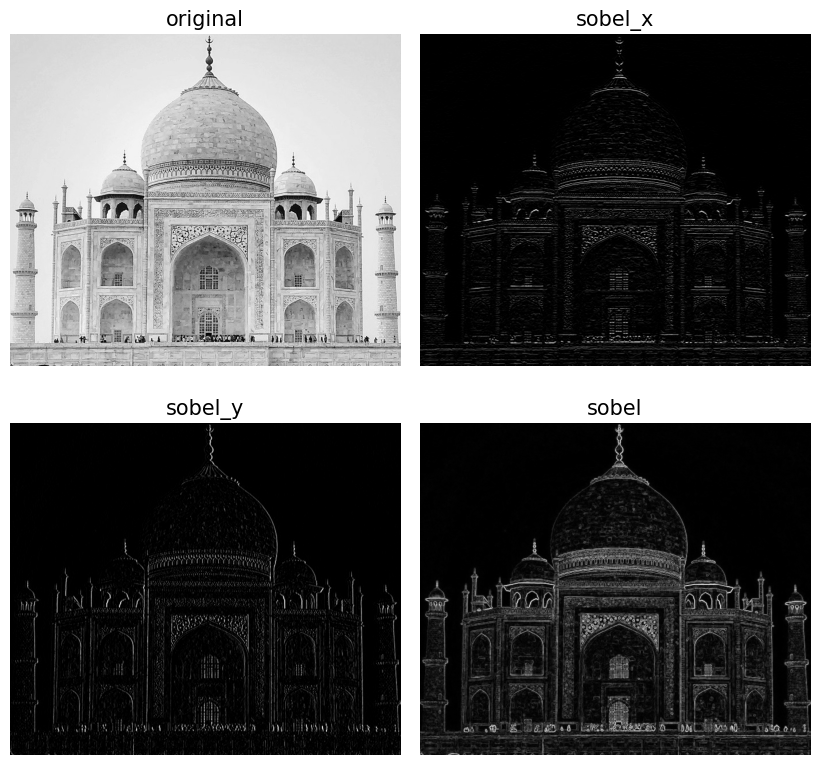

In [34]:
im = imread('images/tajmahal.jpg', as_gray=True) # RGB image to gray scale
edges_x, edges_y = filters.sobel_h(im), filters.sobel_v(im)
edges = filters.sobel(im)

plt.figure(figsize=(8,8))
plt.gray()
plt.subplot(221), plot_image(im, 'original')
plt.subplot(222), plot_image(np.clip(edges_x,0,1), 'sobel_x')
plt.subplot(223), plot_image(np.clip(edges_y,0,1), 'sobel_y')
plt.subplot(224),  plot_image(np.clip(edges,0,1), 'sobel')
plt.subplots_adjust(0,0,1,0.95,0.05,0.05)
plt.show()

### Prewitt, Roberts, Sobel, Scharr, and Laplace edge detector with `scikit-image`

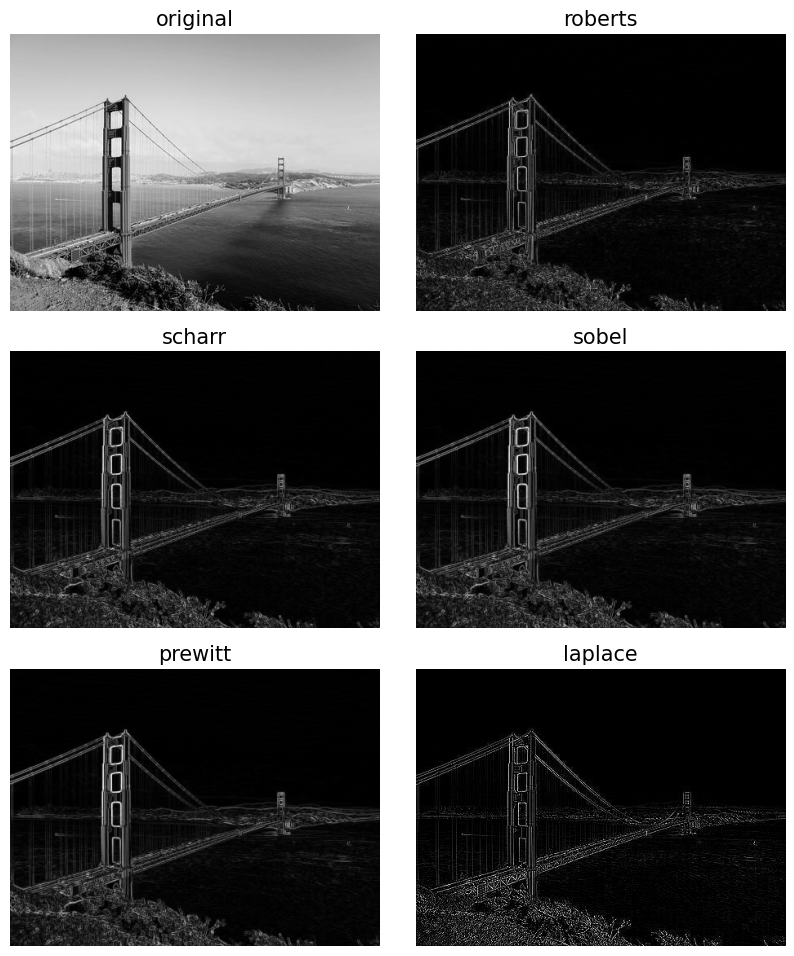

In [37]:
im = imread('images/goldengate.jpg', as_gray=True) # RGB image to gray scale
plt.figure(figsize=(10,12))
plt.gray()
plt.subplot(321), plot_image(im, 'original')
edges = filters.roberts(im)
plt.subplot(322), plot_image(edges, 'roberts')
edges = filters.scharr(im)
plt.subplot(323), plot_image(edges, 'scharr')
edges = filters.sobel(im)
plt.subplot(324), plot_image(edges, 'sobel')
edges = filters.prewitt(im)
plt.subplot(325), plot_image(edges, 'prewitt')
edges = np.clip(filters.laplace(im), 0, 1)
plt.subplot(326), plot_image(edges, 'laplace')
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

###  Compass Edge Detector

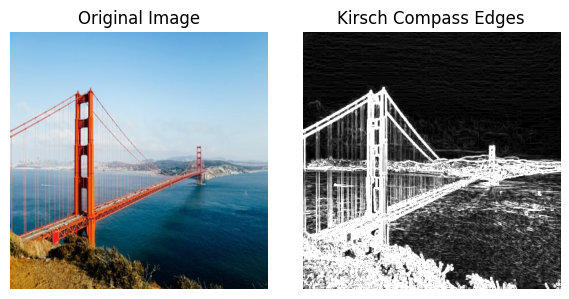

In [21]:
def kirsch_kernels():
    g = [
        np.array([[5, 5, 5], [-3, 0, -3], [-3, -3, -3]]),  # North
        np.array([[-3, 5, 5], [-3, 0, 5], [-3, -3, -3]]),  # NE
        np.array([[-3, -3, 5], [-3, 0, 5], [-3, -3, 5]]),  # East
        np.array([[-3, -3, -3], [-3, 0, 5], [-3, 5, 5]]),  # SE
        np.array([[-3, -3, -3], [-3, 0, -3], [5, 5, 5]]),  # South
        np.array([[-3, -3, -3], [5, 0, -3], [5, 5, -3]]),  # SW
        np.array([[5, -3, -3], [5, 0, -3], [5, -3, -3]]),  # West
        np.array([[5, 5, -3], [5, 0, -3], [-3, -3, -3]])   # NW
    ]
    return g

def kirsch_edge_detection(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    kernels = kirsch_kernels()
    edge_maps = [cv2.filter2D(gray, -1, k) for k in kernels]
    kirsch_response = np.max(np.stack(edge_maps), axis=0)
    return kirsch_response

# Load image
image = cv2.imread("images/goldengate.jpg")
image = cv2.resize(image, (400, 400))

# Detect edges
kirsch_edges = kirsch_edge_detection(image)

# Display
plt.figure(figsize=(6, 3))
plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title("Original Image"), plt.axis('off')
plt.subplot(122), plt.imshow(kirsch_edges, cmap='gray'), plt.title("Kirsch Compass Edges"), plt.axis('off')
plt.tight_layout()
plt.show()

### Interactive percentile gradient-based edge detection using `skimage.filters.rank` with `gradio`

In [ ]:
import gradio as gr
from skimage.filters.rank import gradient_percentile
from skimage.morphology import disk

def apply_gradient_percentile(image: Image, radius: int, percentile_low: int, percentile_high: int):
    if percentile_low > percentile_high:
        raise ValueError("Lower percentile must be <= higher percentile")
    # Convert PIL to grayscale float
    image_np = np.array(image.convert("RGB"))
    image_gray = rgb2gray(image_np)

    # Compute gradient percentile
    gradient_percentile(image_gray, footprint=disk(radius), out=edge_map, p0=percentile_low, p1=percentile_high)

    # Convert to RGB for Gradio
    edge_rgb = np.stack([edge_map]*3, axis=-1)
    return Image.fromarray((255*edge_rgb).astype('uint8'))

interface = gr.Interface(
    fn=apply_gradient_percentile,
    inputs=[
        gr.Image(type="pil", label="Upload Image"),
        gr.Slider(1, 10, step=1, value=3, label="Neighborhood Radius"),
        gr.Slider(0.1, 1, step=0.1, value=0.1, label="Percentile Low"),
        gr.Slider(0, 1, step=0.1, value=1, label="Percentile High")
    ],
    outputs=gr.Image(type="pil", label="Edge Map (Gradient Percentile)"),
    title="Edge Detection using skimage.filters.rank.gradient_percentile",
    description="Upload an image and adjust the radius and percentile to visualize edge maps using percentile-based gradient detection."
)

if __name__ == "__main__":
    interface.launch(share=True)

![](images/grad_percent_edge.png)

### The Canny edge detector with `scikit-image`

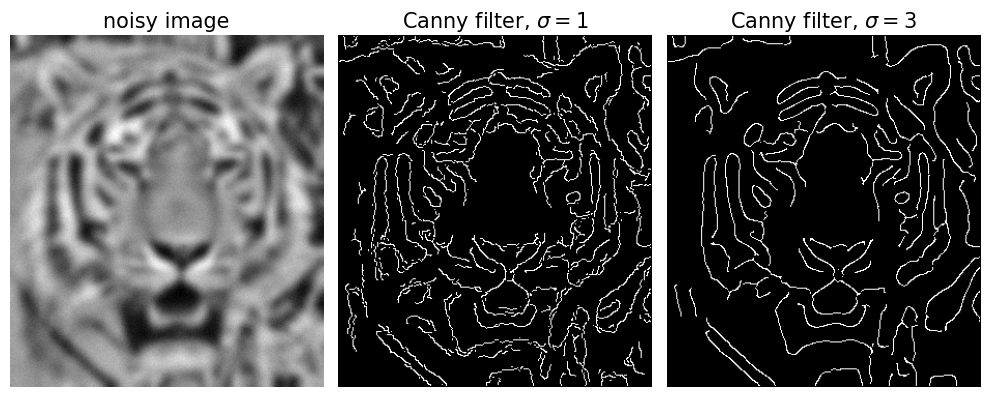

In [38]:
im = imread('images/tiger.jpg', as_gray=True)
im = ndimage.gaussian_filter(im, 4)
im += 0.05 * np.random.random(im.shape)
edges1 = feature.canny(im)
edges2 = feature.canny(im, sigma=2)
fig, (axes1, axes2, axes3) = plt.subplots(nrows=1, ncols=3, figsize=(10, 5), sharex=True, sharey=True)
axes1.imshow(im, cmap=plt.cm.gray), axes1.axis('off'),
axes1.set_title('noisy image', fontsize=15)
axes2.imshow(edges1, cmap=plt.cm.gray), axes2.axis('off')
axes2.set_title('Canny filter, $\sigma=1$', fontsize=15)
axes3.imshow(edges2, cmap=plt.cm.gray), axes3.axis('off')
axes3.set_title('Canny filter, $\sigma=3$', fontsize=15)
fig.tight_layout()
plt.show()

### The LoG and DoG filters

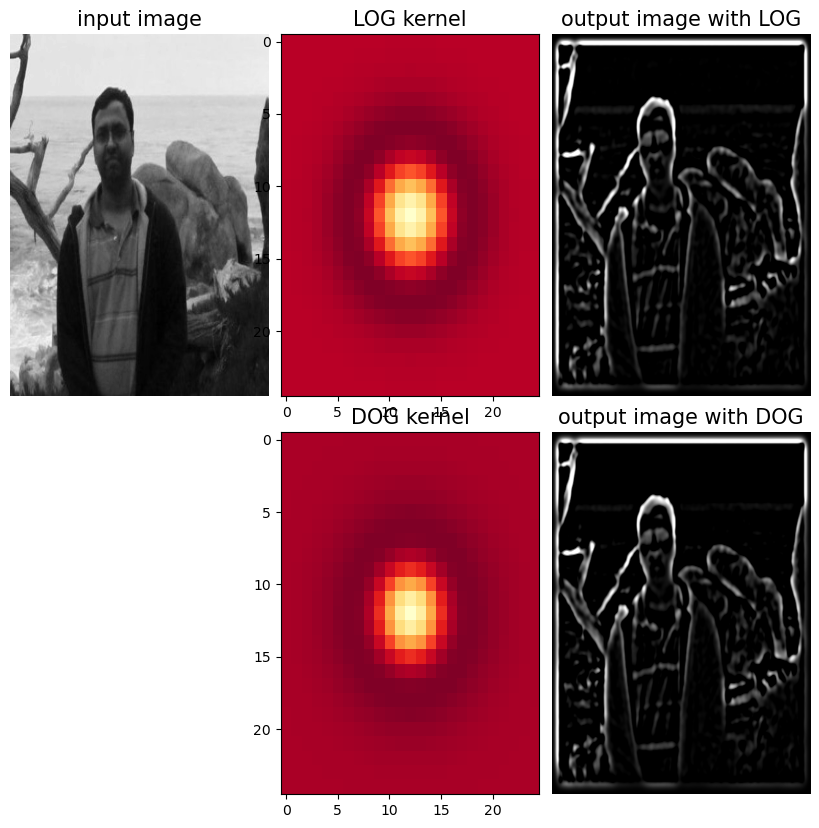

In [42]:
def plot_kernel(kernel, s, name):
    plt.imshow(kernel, cmap='YlOrRd', aspect='auto')

def LOG(k=12, s=3):
    n = 2*k+1 # size of the kernel
    kernel = np.zeros((n,n))
    for i in range(n):
        for j in range(n):
            kernel[i,j] = -(1-((i-k)**2+(j-k)**2)/(2.*s**2))*np.exp(-((i-k)**2+(j-k)**2)/(2.*s**2))/(pi*s**4)
    kernel = np.round(kernel / np.sqrt((kernel**2).sum()),3)
    return kernel

def DOG(k=12, s=3):
    n = 2*k+1 # size of the kernel
    s1, s2 = s * np.sqrt(2), s / np.sqrt(2)
    kernel = np.zeros((n,n))
    for i in range(n):
        for j in range(n):
            kernel[i,j] = np.exp(-((i-k)**2+(j-k)**2)/(2.*s1**2))/(2*pi*s1**2) - np.exp(-((i-k)**2+(j-k)**2)/(2.*s2**2))/(2*pi*s2**2)
    kernel = np.round(kernel / np.sqrt((kernel**2).sum()),3)
    return kernel

s = 3 # sigma value for LoG
img = rgb2gray(imread('images/me_sea.jpg'))
kernel = LOG()
outimg = convolve2d(img, kernel)
plt.figure(figsize=(8,8))
plt.subplots_adjust(0,0,1,0.95,0.05,0.1)
plt.subplot(231), plt.imshow(img, aspect='auto'), plt.axis('off'), plt.title('input image', size=15)
plt.subplot(232), plt.title('LOG kernel', size=15), plot_kernel(kernel, s, 'DOG')
plt.subplot(233), plt.title('output image with LOG', size=15)
plt.imshow(np.clip(outimg,0,1), cmap='gray', aspect='auto'), plt.axis('off') # clip the pixel values in between 0 and 1
kernel = DOG()
outimg = convolve2d(img, DOG())
plt.subplot(235), plt.title('DOG kernel', size=15), plot_kernel(kernel, s, 'DOG')
plt.subplot(236), plt.title('output image with DOG', size=15)
plt.imshow(np.clip(outimg,0,1), cmap='gray', aspect='auto'), plt.axis('off') 
plt.show()    

### The LoG filter with the `scipy.ndimage` module

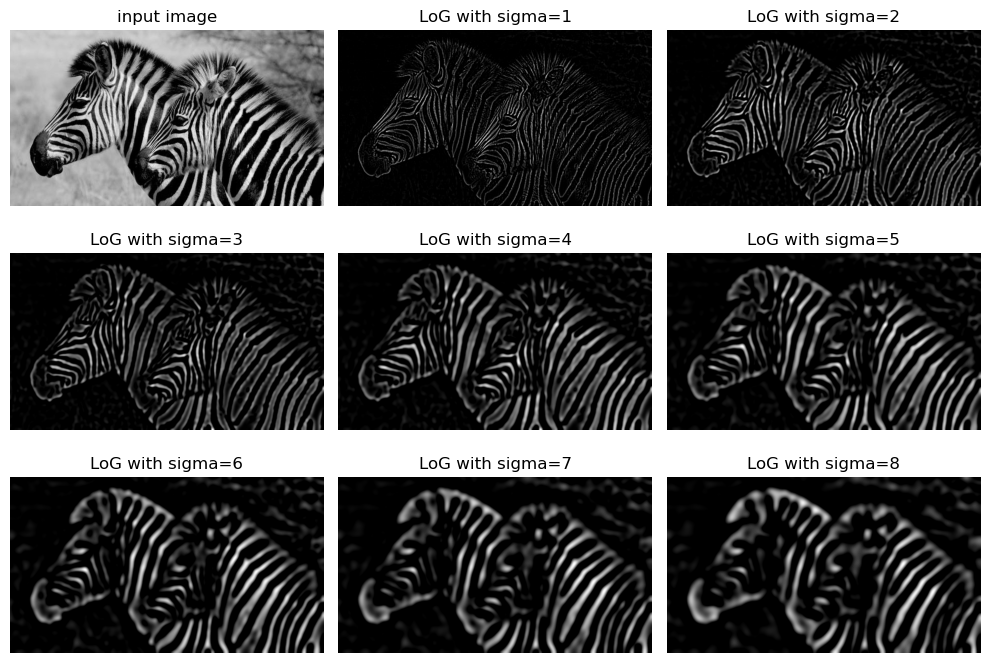

In [16]:
img = rgb2gray(imread('images/zebras.jpg'))
fig = plt.figure(figsize=(10,7))
plt.gray() # show the filtered result in grayscale
plt.subplot(331), plt.imshow(img), plt.axis('off'), plt.title('input image', size=12)
for sigma in range(1,9):
    plt.subplot(3,3,sigma+1)
    img_log = ndimage.gaussian_laplace(img, sigma=sigma)
    plt.imshow(np.clip(img_log,0,1)), plt.axis('off')
    plt.title('LoG with sigma=' + str(sigma), size=12)
plt.tight_layout()
plt.show()

### Edge detection with the LoG filter

#### Edge detection with the Marr and Hildreth's algorithm using the zero-crossing computation

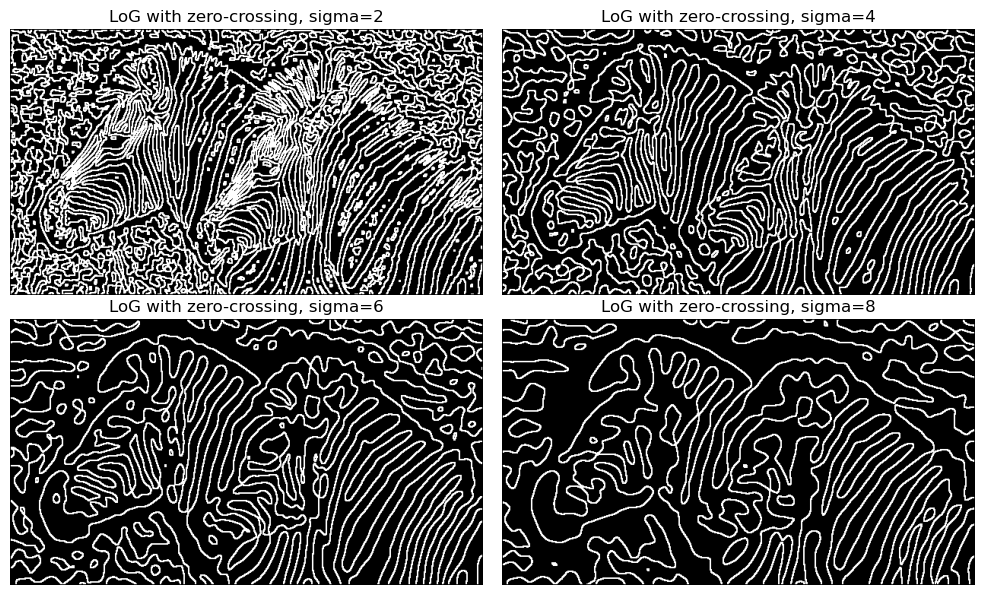

In [30]:
def any_neighbor_opposite_sign(img, i, j):
    '''Check if any neighbor has opposite sign'''
    current = img[i, j]
    for k in range(-1, 2):
        for l in range(-1, 2):
            if k == 0 and l == 0:
                continue  # skip center pixel
            neighbor = img[i + k, j + l]
            if current * neighbor < 0:  # sign change
                return True
    return False

def zero_crossing(img):
    '''Detect zero-crossings in Laplacian-filtered image'''
    out_img = np.zeros_like(img, dtype=np.uint8)
    for i in range(1, img.shape[0] - 1):
        for j in range(1, img.shape[1] - 1):
            if any_neighbor_opposite_sign(img, i, j):
                out_img[i, j] = 255
    return out_img
      
fig = plt.figure(figsize=(10,6))
plt.gray() # show the filtered result in grayscale
for sigma in range(2,10, 2):
    plt.subplot(2,2,sigma//2)
    result = ndimage.gaussian_laplace(img, sigma=sigma)
    plt.imshow(zero_crossing(result)) # implement the function zero_crossing() using the above algorithm
    plt.axis('off')
    plt.title('LoG with zero-crossing, sigma=' + str(sigma), size=12)
plt.tight_layout()
plt.show()

###  Scale-Space Blob Detection using LoG, DoG and DoH Filters with `scikit-image`

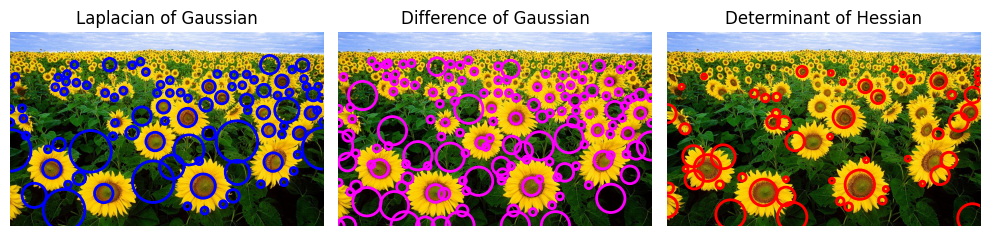

In [37]:
from skimage.feature import blob_dog, blob_log, blob_doh

#image = data.hubble_deep_field()[0:500, 0:500]
image = plt.imread('images/sunflowers.jpg')
image_gray = 1-rgb2gray(image) # detect white blobs

blobs_log = blob_log(image_gray, max_sigma=30, min_sigma=5, num_sigma=7, threshold=0.175)
# Compute radii in the 3rd column.
blobs_log[:, 2] = blobs_log[:, 2] * np.sqrt(2)

blobs_dog = blob_dog(image_gray, max_sigma=30, min_sigma=5, threshold=0.1)
blobs_dog[:, 2] = blobs_dog[:, 2] * np.sqrt(2)

blobs_doh = blob_doh(image_gray, max_sigma=30, min_sigma=5, threshold=0.01)

blobs_list = [blobs_log, blobs_dog, blobs_doh]
colors = ['blue', 'magenta', 'red']
titles = ['Laplacian of Gaussian', 'Difference of Gaussian', 'Determinant of Hessian']
sequence = zip(blobs_list, colors, titles)

fig, axes = plt.subplots(1, 3, figsize=(10, 3), sharex=True, sharey=True)
ax = axes.ravel()

for idx, (blobs, color, title) in enumerate(sequence):
    ax[idx].set_title(title)
    ax[idx].imshow(image)
    for blob in blobs:
        y, x, r = blob
        c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
        ax[idx].add_patch(c)
    ax[idx].set_axis_off()

plt.tight_layout()
plt.show()

### Applying Ridge Operators with `scikit-image`

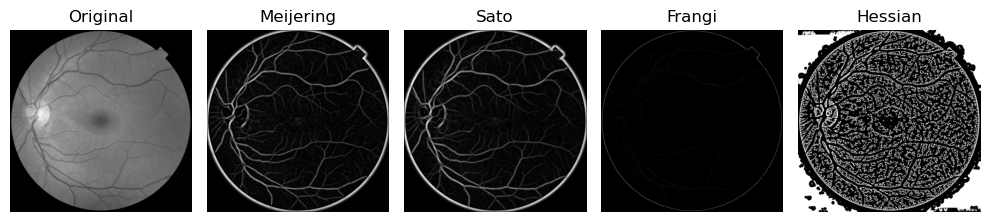

In [12]:
from skimage import data, color, filters
from skimage.filters import meijering, sato, frangi, hessian

# Load a sample image
image = data.retina()  # blood vessels in retina
gray = color.rgb2gray(image)
# Apply different ridge operators
meijering_img = meijering(gray)
sato_img = sato(gray)
frangi_img = frangi(gray, black_ridges=True, sigmas=range(1,5))
hessian_img = hessian(gray)
# Plot the results
fig, axes = plt.subplots(1, 5, figsize=(10, 4))
titles = ['Original', 'Meijering', 'Sato', 'Frangi', 'Hessian']
images = [gray, meijering_img, sato_img, frangi_img, hessian_img]

for ax, title, img in zip(axes, titles, images):
    ax.imshow(img, cmap='gray')
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.show()

### Finding and enhancing edges with `PIL`

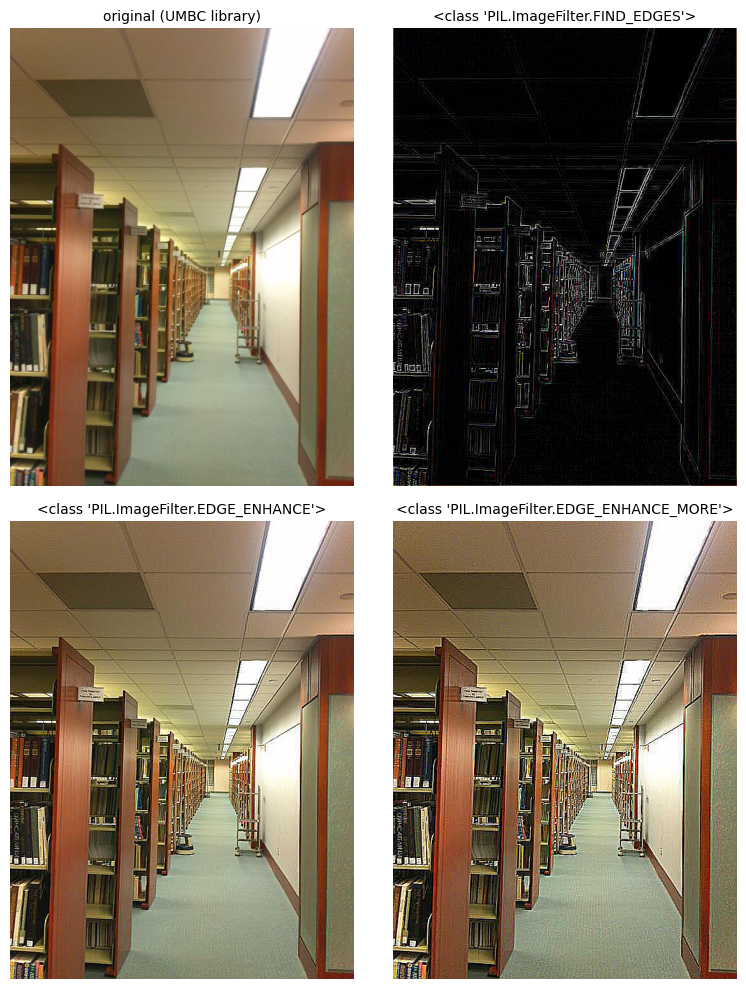

In [6]:
def plot_image(image, title):
    plt.imshow(image), plt.title(title, size=10), plt.axis('off')

im = Image.open('images/umbc_lib.jpg')
plt.figure(figsize=(8,10))
plt.subplot(2,2,1)
plot_image(im, 'original (UMBC library)')
i = 2
for f in (FIND_EDGES, EDGE_ENHANCE, EDGE_ENHANCE_MORE):
    im1 = im.filter(f)
    plt.subplot(2,2,i)
    plot_image(im1, str(f))
    i += 1
plt.tight_layout()
plt.show()

## Structured Edge Detection with `opencv-python` `ximgproc` 

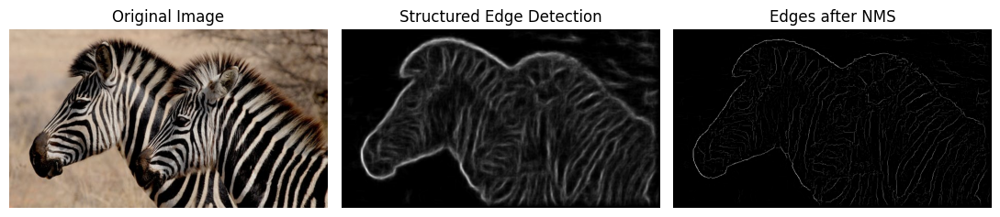

In [6]:
# Load the image
image = cv2.imread('images/zebras.jpg')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Initialize the structured edge detector
model_path = 'models/model.yml.gz'  # Download from https://github.com/opencv/opencv_extra/blob/master/testdata/cv/ximgproc/model.yml.gz
edge_detector = cv2.ximgproc.createStructuredEdgeDetection(model_path)

# Convert to RGB float image
image_float = image.astype(np.float32) / 255.0

# Apply edge detection
edges = edge_detector.detectEdges(image_float)

# Using Orientation Maps and NMS 
# Optional: compute edge orientation map
orientation_map = edge_detector.computeOrientation(edges)

# Optional: apply non-maximum suppression
edges_nms = edge_detector.edgesNms(edges, orientation_map)

# Display
plt.figure(figsize=(11, 4))
plt.subplot(131), plt.title('Original Image'), plt.imshow(image_rgb), plt.axis('off')
plt.subplot(132), plt.title('Structured Edge Detection'), plt.imshow(edges, cmap='gray'), plt.axis('off')
plt.subplot(133), plt.title('Edges after NMS'), plt.imshow(edges_nms, cmap='gray'), plt.axis('off')
plt.tight_layout()
plt.show()

### Guided Filtering for Edge Enhancement with `opencv-python` `ximgproc`

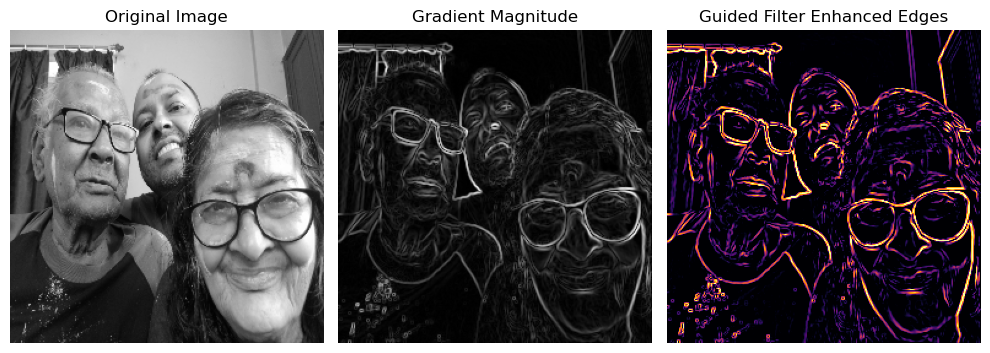

In [7]:
from cv2.ximgproc import guidedFilter

# Load grayscale image and resize for faster processing
img = cv2.imread('images/we.jpg', cv2.IMREAD_GRAYSCALE)
img = cv2.resize(img, (256, 256))

# Normalize to float32 [0, 1]
img_float = img.astype(np.float32) / 255.0

# Step 1: Compute gradient magnitude
grad_x = cv2.Sobel(img_float, cv2.CV_32F, 1, 0, ksize=3)
grad_y = cv2.Sobel(img_float, cv2.CV_32F, 0, 1, ksize=3)
grad_mag = np.sqrt(grad_x**2 + grad_y**2)

# Step 2: Apply guided filter (guide = original image, input = grad_mag)
radius = 8
eps = 1e-3  # Regularization term
grad_mag_smooth = guidedFilter(guide=img_float, src=grad_mag, radius=radius, eps=eps)

# Step 3: Edge enhancement by subtraction
enhanced_edges = grad_mag - grad_mag_smooth
enhanced_edges = np.clip(enhanced_edges, 0, 1)

# Display all steps
plt.figure(figsize=(10, 4))
plt.subplot(131), plt.imshow(img, cmap='gray'), plt.title('Original Image'), plt.axis('off')
plt.subplot(132), plt.imshow(grad_mag, cmap='gray'), plt.title('Gradient Magnitude'), plt.axis('off')
plt.subplot(133), plt.imshow(enhanced_edges, cmap='inferno'), plt.title('Guided Filter Enhanced Edges'), plt.axis('off')
plt.tight_layout()
plt.show()

## Deep Learning Model-Based Edge Detection with PiDiNet and HED

cpu


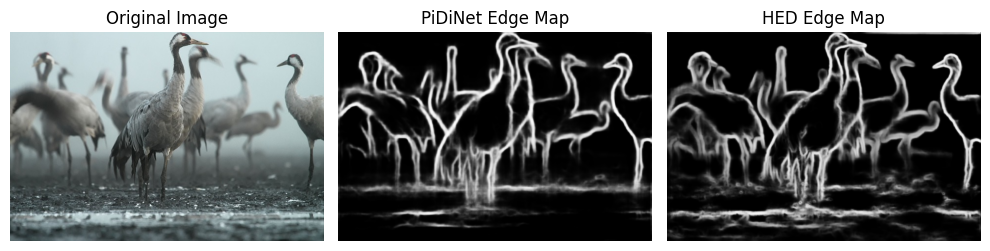

In [4]:
import torch
from controlnet_aux import PidiNetDetector, HEDdetector

# Initialize PiDiNet detector
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

# Load and preprocess image
img_path = 'images/cranes.jpg'
orig = Image.open(img_path).convert('RGB')
orig_np = np.array(orig)

pidi_detector = PidiNetDetector.from_pretrained('lllyasviel/Annotators').to(device)
hed_detector = HEDdetector.from_pretrained("lllyasviel/Annotators").to(device)

# Detect edges
with torch.no_grad():
    edge_hed = hed_detector(orig)
    edge_pidi_pil = pidi_detector(orig)
    edge_pidi = np.array(edge_pidi_pil.convert('L')) / 255.0  # normalize

# Display results
plt.figure(figsize=(10, 4))
plt.subplot(131), plt.imshow(orig_np), plt.title('Original Image'), plt.axis('off')
plt.subplot(132), plt.imshow(edge_pidi, cmap='gray'), plt.title('PiDiNet Edge Map'), plt.axis('off')
plt.subplot(133), plt.imshow(edge_hed, cmap='gray'), plt.title('HED Edge Map'), plt.axis('off')
plt.tight_layout()
plt.show()

## Image pyramids (Gaussian and Laplacian) – blending images

### A Gaussian pyramid with `scikit-image`

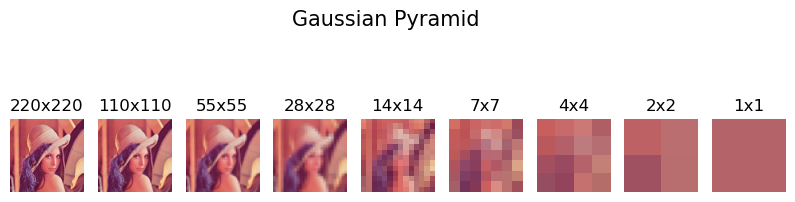

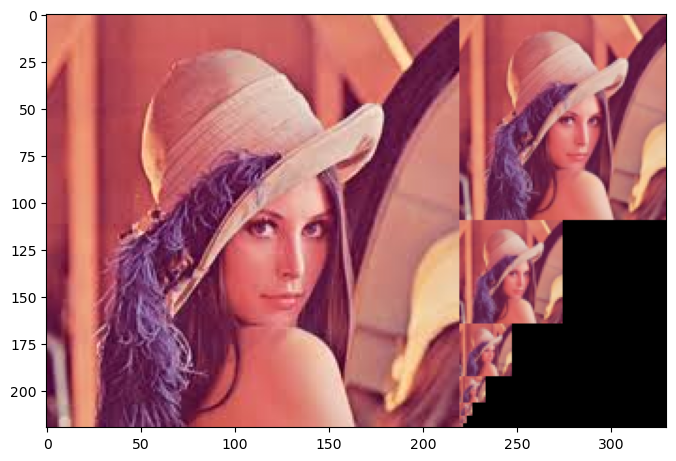

In [17]:
image = imread('images/lena.jpg')
nrows, ncols = image.shape[:2]
pyramid = tuple(pyramid_gaussian(image, downscale=2, channel_axis=-1))

plt.figure(figsize=(10,3))
i, n = 1, len(pyramid)
for p in pyramid:
    plt.subplot(1,n,i), plt.imshow(p),  plt.title(str(p.shape[0]) + 'x' + str(p.shape[1])), plt.axis('off')
    i += 1
plt.suptitle('Gaussian Pyramid', size=15)
plt.show()

compos_image = np.zeros((nrows, ncols + ncols // 2, 3), dtype=np.double)
compos_image[:nrows, :ncols, :] = pyramid[0]

i_row = 0
for p in pyramid[1:]:
    n_rows, n_cols = p.shape[:2]
    compos_image[i_row:i_row + n_rows, ncols:ncols + n_cols] = p
    i_row += n_rows

fig, ax = plt.subplots(figsize=(8,8))
ax.imshow(compos_image)
plt.show()

### A Laplacian pyramid with `scikit-image`

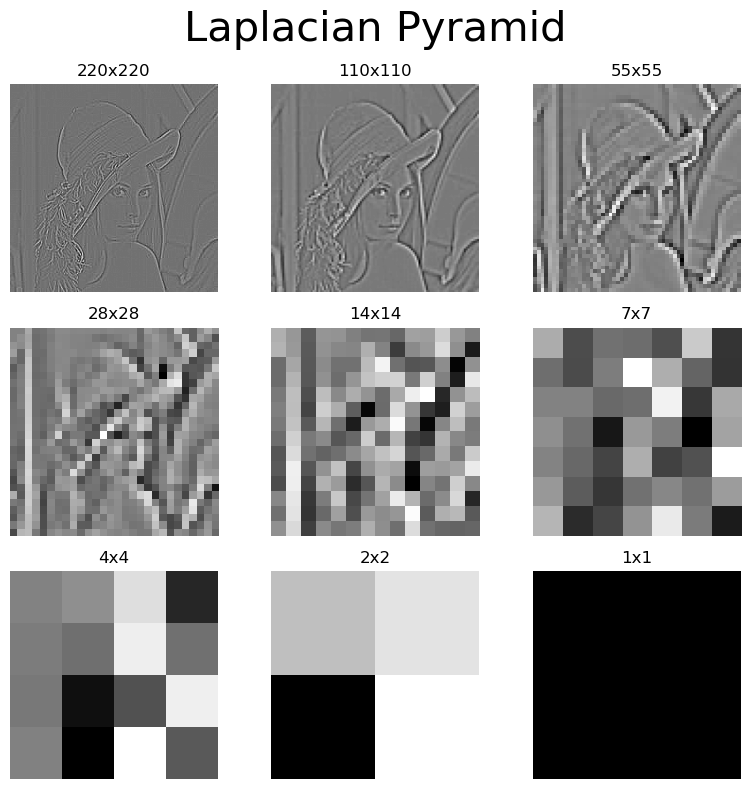

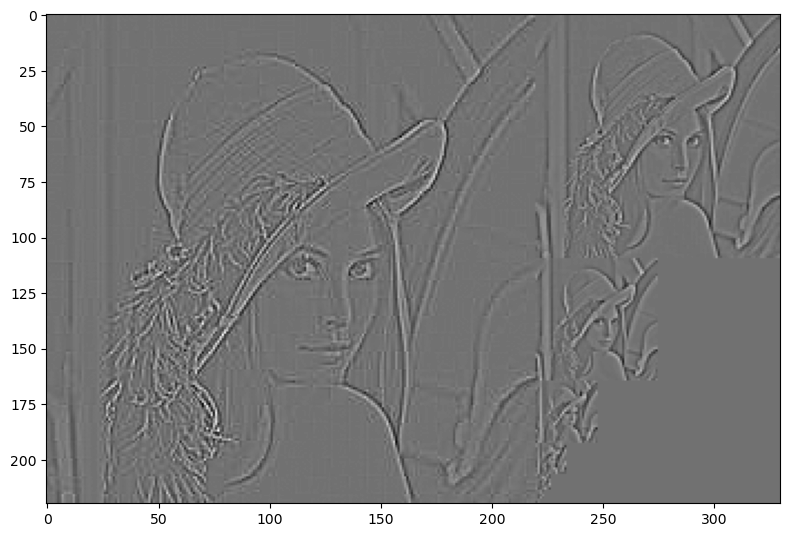

In [19]:
image = imread('images/lena.jpg')
#image = imread('../new images/orange.png')[...,:3]
nrows, ncols = image.shape[:2]
pyramid = tuple(pyramid_laplacian(image, downscale=2, channel_axis=-1))

plt.figure(figsize=(8,8))
i, n = 1, len(pyramid)
for p in pyramid:
    plt.subplot(3,3,i), plt.imshow(rgb2gray(p), cmap='gray'), plt.title(str(p.shape[0]) + 'x' + str(p.shape[1]))
    plt.axis('off')
    i += 1
plt.suptitle('Laplacian Pyramid', size=30)
plt.tight_layout()
plt.show()

composite_image = np.zeros((nrows, ncols + ncols // 2), dtype=np.double)

composite_image[:nrows, :ncols] = rgb2gray(pyramid[0])

i_row = 0
for p in pyramid[1:]:
    n_rows, n_cols = p.shape[:2]
    composite_image[i_row:i_row + n_rows, ncols:ncols + n_cols] = rgb2gray(p)
    i_row += n_rows

fig, ax = plt.subplots(figsize=(8,8))
ax.imshow(composite_image, cmap='gray')
plt.tight_layout()
plt.show()

### Constructing the Gaussian and the Laplacian Pyramid with `scikit-image`

In [8]:
#! pip install -U scikit-image
import skimage
print(skimage.__version__)

0.25.2


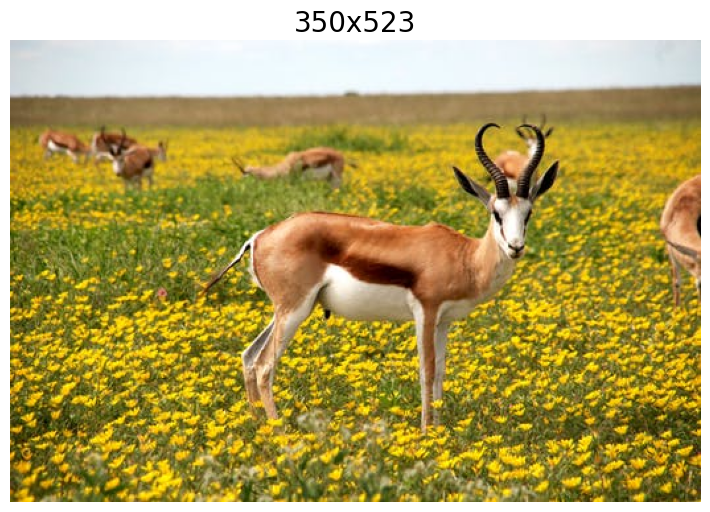

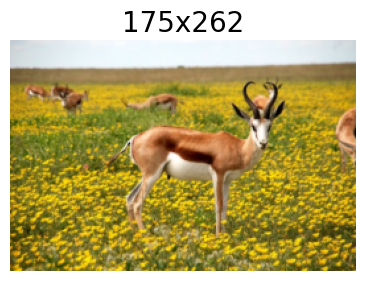

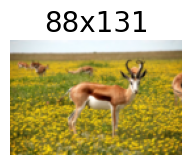

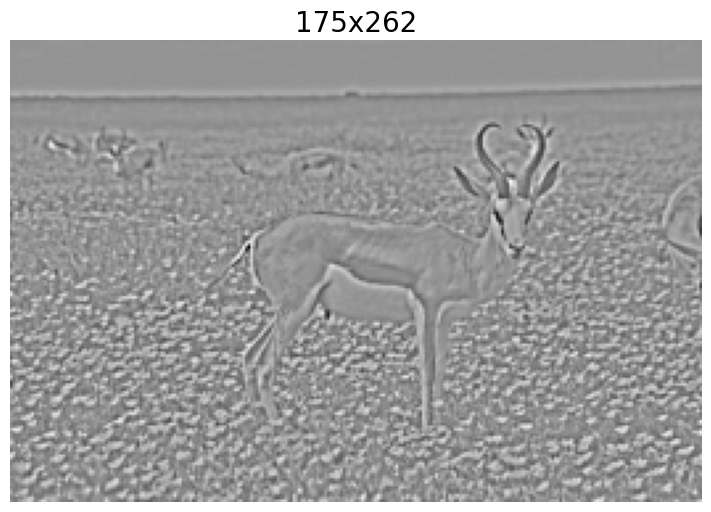

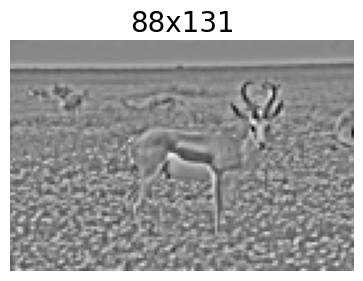

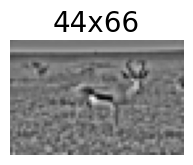

In [50]:
image = imread('images/antelops.jpeg')

def get_gaussian_pyramid(image):
    rows, cols, dim = image.shape
    gaussian_pyramid = [image]
    while rows > 1 and cols > 1:
        #print(rows, cols)
        image = pyramid_reduce(image, downscale=2, channel_axis=2)
        gaussian_pyramid.append(image)
        #print(image.shape)
        rows //= 2
        cols //= 2
    return gaussian_pyramid

def get_laplacian_pyramid(gaussian_pyramid):
    laplacian_pyramid = [gaussian_pyramid[len(gaussian_pyramid)-1]]
    for i in range(len(gaussian_pyramid)-2, -1, -1):
        image = gaussian_pyramid[i] - resize(pyramid_expand(gaussian_pyramid[i+1], channel_axis=2), gaussian_pyramid[i].shape)
        #print(i, image.shape)
        laplacian_pyramid.append(np.copy(image))
    laplacian_pyramid = laplacian_pyramid[::-1]
    return laplacian_pyramid


gaussian_pyramid = get_gaussian_pyramid(image)
laplacian_pyramid = get_laplacian_pyramid(gaussian_pyramid)
    
w, h = 10, 6
for i in range(3):
    plt.figure(figsize=(w,h))
    p = gaussian_pyramid[i]
    plt.imshow(p)
    plt.title(str(p.shape[0]) + 'x' + str(p.shape[1]), size=20)
    plt.axis('off')
    w, h = w / 2, h / 2
    plt.show()
    
w, h = 10, 6
for i in range(1,4):
    plt.figure(figsize=(w,h))
    p = laplacian_pyramid[i]
    plt.imshow(rgb2gray(p), cmap='gray')
    plt.title(str(p.shape[0]) + 'x' + str(p.shape[1]), size=20)
    plt.axis('off')
    w, h = w / 2, h / 2
    plt.show()

### Reconstructing an image only from its Laplacian pyramid

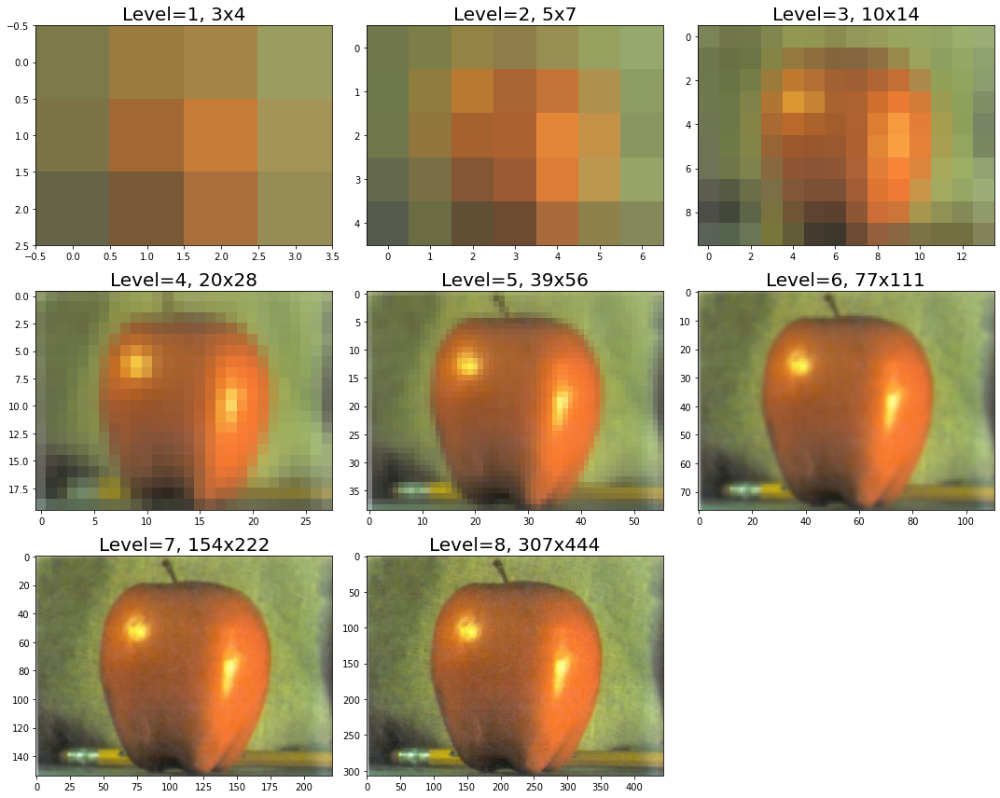

In [10]:
def reconstruct_image_from_laplacian_pyramid(pyramid):
    i = len(pyramid) - 2
    prev = pyramid[i+1]
    plt.figure(figsize=(15,12))
    j = 1
    while i >= 0:
        prev = resize(pyramid_expand(prev, upscale=2, channel_axis=2), pyramid[i].shape)
        im = np.clip(pyramid[i] + prev,0,1)
        plt.subplot(3,3,j)
        plt.imshow(im, aspect='auto')
        plt.title('Level=' + str(j) + ', ' + str(im.shape[0]) + 'x' + str(im.shape[1]), size=20)
        prev = im
        i -= 1
        j += 1
    plt.tight_layout()
    plt.show()
    return im

image = imread('images/apple.png')[...,:3] / 255
pyramid = get_laplacian_pyramid(get_gaussian_pyramid(image))
im = reconstruct_image_from_laplacian_pyramid(pyramid)

### Blending images with pyramids

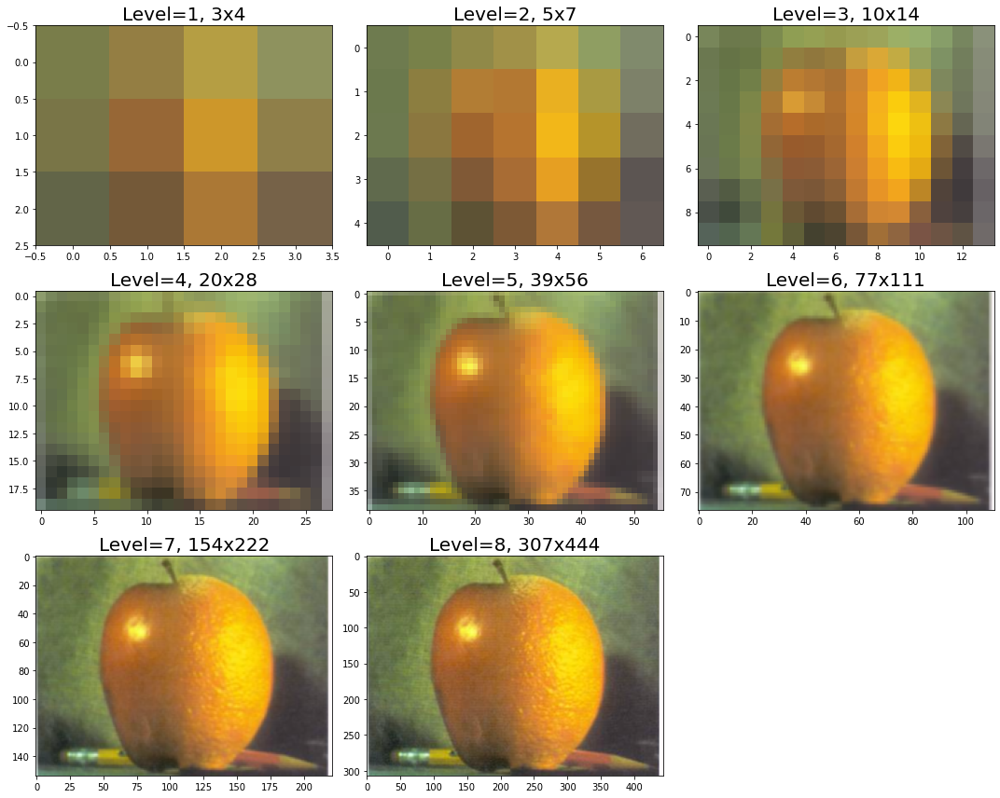

In [12]:
A = imread('images/apple.png')[...,:3] / 255
B = imread('images/orange.png')[...,:3] / 255
M = imread('images/mask.png')[...,:3] / 255

rows, cols, dim = A.shape
pyramidA = get_laplacian_pyramid(get_gaussian_pyramid(A))
pyramidB = get_laplacian_pyramid(get_gaussian_pyramid(B))
pyramidM = get_gaussian_pyramid(M)

pyramidC = []
for i in range(len(pyramidM)):
    im = pyramidM[i]*pyramidA[i] + (1-pyramidM[i])*pyramidB[i]
    #print(np.max(im), np.min(im), np.mean(im))
    pyramidC.append(im)

im = reconstruct_image_from_laplacian_pyramid(pyramidC)

## Questions

1. Use the `skimage.filters` module's `unsharp_mask()` function with different values of the radius and amount parameters to sharpen an image.
2. Use the `PIL.ImageFilter` class's `UnsharpMask()` function with different values of the radius and percent parameters to sharpen an image.
3. Sharpen a color (RGB) image using the sharpen kernel $[[0, -1, 0], [-1, 5, -1], [0, -1, 0]]$. (Hint: use `scipy.signal` module's `convolve2d()` function for each of the color channels one by one.)
4. With the `scipy.ndimage` module, sharpen a color image directly (without sharpening individual color channels one by one).
5. Compute and display a Gaussian pyramid with the lena gray-scale input image using the `skimage.transform` module's `pyramid_laplacian()` function.
6. Construct the Gaussian pyramid with the `reduce()` function of the `transform` module of `scikit-image` and Laplacian pyramid from the Gaussian pyramid and `expand()` function, with the algorithm discussed.
7. Compute the Laplacian pyramid for an image and construct the original image from it.
8. Show that the LoG and DoG kernels look like a **Mexican hat** in a 3D surface plot.
9. Implement Marr and Hildreth's zero-crossing algorithm for edge detection with **LoG**.
10. Implement the non-max suppression algorithm to thin the edges in a gradient magnitude image.